# MetroPT-3: Telemetry Insight
## Exploratory Data Analysis

**Author:** Daniel Okereke  
**Assessment:** Telemetry-to-Insight  
**Dataset:** MetroPT-3 Air Compressor Telemetry  
**Date:** August 2026

### Introduction

This notebook analyses validated and preprocessed MetroPT-3 air-compressor telemetry to understand compressor operating behaviour and identify interpretable patterns associated with **documented air-leak periods and abnormal compressor workload**.

The analysis follows an operationally focused approach rather than exhaustively exploring every available telemetry signal. It first establishes normal compressor behaviour, then derives a focused set of operational metrics describing **loaded utilisation, cycling behaviour, and the persistence of loaded operation**.

These features are subsequently evaluated against documented air-leak periods to determine how compressor behaviour changes around known events. Similar behaviour outside the documented failure periods is also investigated to assess whether the derived indicators represent air-leak-specific behaviour or more general abnormal asset operation.

The analysis therefore progresses from:

- understanding normal compressor operating and pressure behaviour;
- deriving interpretable utilisation, cycle-frequency, and loaded-cycle-duration metrics;
- investigating changes around documented air-leak periods;
- introducing rolling utilisation where sustained loaded operation provides evidence for additional temporal context;
- comparing documented events with non-documented periods of abnormal workload; and
- translating the findings into actionable **condition-monitoring and maintenance insight**.

The objective is not to assume that abnormal compressor behaviour diagnoses an air leak, but to determine whether telemetry can identify operating conditions that may warrant engineering investigation.

## Project Scope

This project focuses on transforming MetroPT-3 compressor telemetry into interpretable operational insight, with particular emphasis on **compressor utilisation, documented air-leak behaviour, and potential operational inefficiency**.

The analysis will:

- establish and explain normal compressor operating behaviour using telemetry associated with compressor control, loaded state, pressure response, and electrical demand;
- use documented air-leak periods as external reference windows for investigating changes from normal operating behaviour;
- develop interpretable operational metrics that quantify **compressor utilisation, cycling frequency, and the persistence of loaded operation**;
- evaluate whether documented air-leak periods coincide with measurable changes in compressor workload and operating behaviour;
- investigate whether similar abnormal operating behaviour also occurs outside the documented air-leak periods; and
- translate the findings into actionable **condition-monitoring, maintenance, and operational insights**.

The analysis does not assume that elevated compressor activity represents an air leak. Instead, documented failures are used to understand whether particular operating characteristics are associated with known events and whether those characteristics could help identify abnormal asset behaviour requiring investigation.

### Telemetry Scope and Signal Selection

The MetroPT-3 dataset contains **15 telemetry signals** covering compressor pressure, temperature, electrical demand, pneumatic behaviour, and operating-state indicators.

Rather than exhaustively engineering features from every available signal, the POC prioritises telemetry with a direct and interpretable relationship to **compressor operating state, workload, pressure response, and electrical demand**.

The primary signals selected for detailed investigation are:

| Telemetry | Role in the analysis |
|---|---|
| **`MPG`** | Provides compressor control-state context and supports interpretation of when loaded operation is initiated |
| **`COMP`** | Provides additional compressor control-state information and supports validation of operating behaviour |
| **`DV_eletric`** | Identifies loaded compressor operation and provides the basis for utilisation, load-cycle frequency, and loaded-cycle duration |
| **`TP2`** | Represents compressor pressure and provides physical context for changes in loaded operation |
| **`Motor_current`** | Provides an indication of electrical demand associated with compressor operating state |

Together, these variables provide an interpretable view of the relationship between compressor **control state, operating load, pressure response, and electrical demand**.

The remaining telemetry signals are retained within the dataset but are not automatically transformed into additional features.

**Feature engineering is intentionally limited to metrics that provide distinct, interpretable evidence relevant to compressor workload and the documented air-leak periods.** Features are introduced progressively and retained where the analysis demonstrates operational value, rather than generating a large number of metrics without a clear engineering justification.

Where sustained deviations from recent operating behaviour are identified, these findings may provide a foundation for future **condition-monitoring and predictive-maintenance development**. A future production implementation could, for example, use robust change-point detection against a preceding operating window together with persistence and loaded-cycle duration.

The current POC remains focused on deriving and visualising interpretable telemetry insight rather than assuming that an additional predictive model is required where the observed operational evidence already provides useful information.

## Proof of Concept

The proof of concept aims to demonstrate whether MetroPT-3 telemetry can be transformed into meaningful and interpretable operational insight through a lightweight and reproducible analytical pipeline.

The POC evaluates whether:

1. normal compressor operating behaviour can be identified and explained from telemetry;
2. compressor workload can be quantified through interpretable operational metrics including **loaded utilisation, load-cycle frequency, and observed loaded-cycle duration**;
3. documented air-leak periods exhibit measurable changes from normal compressor operating behaviour;
4. rolling utilisation can provide additional temporal context by identifying **developing or sustained changes in compressor workload**;
5. the combination of utilisation, cycle persistence, and underlying pressure/state telemetry can identify **abnormal operating conditions that may warrant engineering investigation**; and
6. similar operating characteristics occur outside the documented air-leak periods, helping assess whether the derived indicators represent air-leak-specific behaviour or broader abnormal compressor workload.

The MetroPT-3 telemetry is not treated as a predefined binary classification problem. The telemetry itself contains no failure label; instead, documented air-leak periods are used as **external reference windows** against which compressor behaviour and the engineered operational features are evaluated.

The objective is therefore not to assume that elevated compressor activity diagnoses an air leak, but to determine whether the telemetry contains interpretable operating characteristics associated with known failure periods and whether those characteristics could provide useful **condition-monitoring and maintenance insight**.

Where sustained deviations from recent operating behaviour are observed, these findings may provide a foundation for future monitoring and predictive-maintenance development. Potential future work could include robust change-point detection against a preceding operating baseline, combined with persistence and loaded-cycle duration to support an operational **Green-Amber-Red condition-monitoring framework**.

Additional modelling is not introduced within the POC where the engineered features and observed operational evidence already provide sufficient interpretable insight.

## Dataset Context

The MetroPT-3 dataset contains telemetry collected from the compressor of an **Air Production Unit (APU) installed on a metropolitan train**. The complete source dataset contains approximately **1.52 million telemetry observations spanning February to August 2020** and is described by **15 sensor features**, comprising **7 analogue sensors and 8 digital sensors**.

Although the UCI documentation contains inconsistent descriptions of the sampling frequency, validation of the downloaded telemetry identified a **median sampling interval of 10 seconds**, corresponding to approximately **0.1 Hz**. The analysis therefore uses the observed telemetry timestamps as the basis for understanding the sampling behaviour.

For this POC, a controlled development period from **1 March to 31 July 2020** was selected, resulting in **1,081,134 telemetry observations**.

The selected period provides:

- normal operating history before the first documented air-leak event;
- coverage of all documented air-leak periods occurring between April and July; and
- a post-failure period following the final documented July air leak.

Using a controlled development dataset also supports **computational and cost efficiency** during iterative analysis. The source dataset is downloaded once through an idempotent ingestion process, persisted in **Parquet format** for efficient downstream I/O, validated, and preprocessed before being consumed by this notebook.

This approach reduces unnecessary repeated downloads and processing while retaining the operational periods required to address the objectives of the POC.

*Source: UCI Machine Learning Repository - MetroPT-3 Dataset*

### Telemetry Continuity and Missing Data

Validation identified periods of irregular telemetry coverage, including gaps between consecutive observations.

These gaps are retained rather than imputed because their occurrence may be associated with underlying technical or operational conditions rather than random missingness. Reconstructing missing timestamps or inferring compressor states could therefore introduce artificial operating behaviour that was not observed in the source telemetry.

The analysis consequently uses the telemetry **as observed**:

- missing time periods are not reconstructed;
- compressor states are not inferred across telemetry gaps; and
- derived temporal metrics are interpreted with the available telemetry coverage in mind.

This preserves the integrity of the original telemetry while allowing data-coverage behaviour to remain available for later investigation where operationally relevant.

## Documented Event Failures

The telemetry itself is unlabelled; however, documented maintenance records provide known periods during which air leaks occurred. These periods provide reference windows for comparing normal compressor behaviour with known failure conditions.

| Nr.  |    Start Time   | End Time        | Failure  | Severity    | Report                        |
|------|:---------------:|-----------------|----------|-------------|-------------------------------|
| #1   |  4/18/2020 0:00 | 4/18/2020 23:59 | Air Leak | High Stress |                               |
| #2   | 5/29/2020 23:30 | 5/30/2020 6:00  | Air Leak | High Stress | Maintenance on 30Apr at 12:00 |
| #3   | 6/5/2020 10:00  | 6/7/2020 14:30  | Air Leak | High Stress | Maintenance on 8Jun at 16:00  |
| #4   | 7/15/2020 14:30 | 7/15/2020 19:00 | Air Leak | High Stress | Maintenance on 16Jul at 00:00 |

The documented periods are not initially treated as binary classification targets. Instead, they provide known reference points for investigating whether compressor utilisation, pressure behaviour, electrical demand, or other relevant telemetry changes systematically during air leakage.

This allows observed telemetry behaviour to be compared against known operational events and provides a basis for assessing whether statistically meaningful indicators could support future anomaly detection or predictive-maintenance solutions.

### Operational Context

A compressor is a mechanical device that increases air pressure by compressing air into a smaller volume. Within the MetroPT-3 system, the compressor forms part of the **Air Production Unit (APU)** installed on a metropolitan train.

The APU's operation involves maintaining air pressure through different compressor operating states. In the MetroPT-3 system, the compressor can operate under load, offloaded, or switched off, with control signals responding to changes in APU pressure. Understanding these operating states and their associated pressure and electrical behaviour provides the foundation for investigating **compressor utilisation, air leakage, and potential energy inefficiency**.

*Source: UCI Machine Learning Repository - MetroPT-3 Dataset*

In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
PROJECT_ROOT = Path.cwd().parent

PROCESSED_PATH = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "metropt3_processed.parquet"
)

In [3]:
df = pd.read_parquet(PROCESSED_PATH)

print(f"Rows: {len(df):,}")
print(f"Columns: {len(df.columns)}")
print(f"Start: {df['timestamp'].min()}")
print(f"End: {df['timestamp'].max()}")

Rows: 1,081,134
Columns: 16
Start: 2020-03-01 04:00:09
End: 2020-07-31 23:59:52


In [4]:
df.head()

,timestamp,TP2,TP3,H1,DV_pressure,Reservoirs,Oil_temperature,Motor_current,COMP,DV_eletric,Towers,MPG,LPS,Pressure_switch,Oil_level,Caudal_impulses
0,2020-03-01 04:00:09,-0.010,9.510,9.502,-0.026,9.508,67.025,3.8275,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
1,2020-03-01 04:00:19,-0.012,9.494,9.484,-0.026,9.490,66.950,3.7975,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
2,2020-03-01 04:00:29,-0.012,9.476,9.466,-0.026,9.474,66.825,3.7725,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
3,2020-03-01 04:00:38,-0.010,9.458,9.450,-0.026,9.454,66.725,3.8825,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
4,2020-03-01 04:00:48,-0.010,9.440,9.432,-0.026,9.438,66.675,3.8925,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0


## 1. Dataset Overview and Sensor Distributions

The processed development dataset covers March to July 2020, capturing
normal operation, all documented air-leak periods, and a post-event recovery
period.

Descriptive statistics are first examined to understand the operating ranges
and distributions of the analogue and digital telemetry signals.

In [5]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
timestamp,1081134,2020-05-16 10:58:02.345606,2020-03-01 04:00:09,2020-04-07 00:55:42.500000,2020-05-16 19:47:44,2020-06-23 15:03:12,2020-07-31 23:59:52,NaN
TP2,1081134.0,1.581921,-0.032,-0.014,-0.012,-0.01,10.676,3.427735
TP3,1081134.0,8.976847,0.73,8.48,8.95,9.498,10.302,0.659657
H1,1081134.0,7.3391,-0.036,8.21,8.75,9.37,10.288,3.537626
DV_pressure,1081134.0,0.084188,-0.032,-0.024,-0.022,-0.018,9.844,0.44156
Reservoirs,1081134.0,8.977182,0.712,8.482,8.95,9.498,10.3,0.65887
Oil_temperature,1081134.0,63.387817,15.4,58.6,63.75,67.9,89.05,6.633027
Motor_current,1081134.0,2.191446,0.02,0.0425,0.045,3.8425,9.295,2.344863
COMP,1081134.0,0.809195,0.0,1.0,1.0,1.0,1.0,0.392936
DV_eletric,1081134.0,0.187387,0.0,0.0,0.0,0.0,1.0,0.390222


## 2. Understanding Compressor Operating Behaviour

Before investigating the documented air-leak periods, the selected telemetry signals are explored to understand how compressor operating states are represented within the data.

The analysis focuses on the relationship between **compressor pressure (`TP2`), control state (`COMP` and `MPG`), loaded operation (`DV_eletric`), and electrical demand (`Motor_current`)**.

Rather than assuming how these signals behave, a series of operational hypotheses are evaluated using distributions, grouped comparisons, operating-state consistency checks, and supporting statistical relationships.

This provides the operational context required to interpret the engineered utilisation and cycling features introduced later in the analysis.

### 2b. TP2 Pressure Distribution

`TP2` provides a direct physical measurement of compressor pressure and is therefore examined first to understand how pressure behaves across the telemetry period.

The distribution is used to investigate whether compressor pressure reflects a single operating regime or whether distinct pressure patterns are present that may correspond with different compressor operating states.

This leads to the following operational hypothesis:

> **Distinct TP2 pressure regimes are associated with changes in compressor operating state.**

Based on the MetroPT-3 documentation, this hypothesis can be evaluated using complementary telemetry:

- `COMP` → compressor/intake control state;
- `DV_eletric` → indicates whether the compressor is operating under load;
- `MPG` → provides additional compressor control-state context; and
- `Motor_current` → provides a continuous physical measure of electrical demand associated with compressor operation.

The analysis therefore follows an evidence-led sequence of:

> **Observation --> Hypothesis --> Operating-state comparison --> State-consistency assessment --> Supporting physical and statistical evidence --> Operational interpretation**

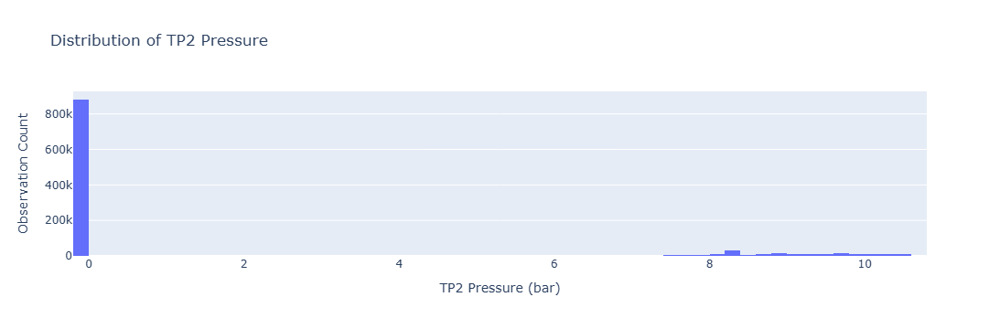

In [6]:
fig = px.histogram(
    df,
    x="TP2",
    nbins=100,
    title="Distribution of TP2 Pressure"
)

fig.update_layout(
    xaxis_title="TP2 Pressure (bar)",
    yaxis_title="Observation Count"
)

fig.show()

#### TP2 Distribution Observation

The `TP2` distribution is strongly **bimodal**, with the majority of observations concentrated close to **0 bar** and a smaller but clearly separated operating region around **8–10 bar**.

The large separation between these pressure regimes suggests that the distribution is unlikely to represent ordinary variation around a single operating condition. Instead, it provides initial evidence that `TP2` reflects **distinct compressor operating states**.

The next step therefore compares `TP2` with the compressor control and loaded-state signals to determine whether these pressure regimes correspond systematically with changes in compressor operation.

### 2c. Operating-State Evaluation 1: TP2 vs COMP

The first comparison examines whether the two `TP2` pressure regimes are systematically associated with the compressor control state represented by `COMP`.

`COMP` is examined because the MetroPT-3 documentation associates this signal with compressor/intake control behaviour.

If the observed `TP2` pressure regimes reflect different compressor operating states, the distribution of `TP2` should differ materially between the two `COMP` states.

> **Operational question:** Is compressor pressure (`TP2`) systematically associated with the `COMP` operating state?

### TP2 v COMP

In [7]:
df.groupby("COMP")["TP2"].describe()

,count,mean,std,min,25%,50%,75%,max
COMP,,,,,,,,
0.0,206286.0,8.301507,2.336721,-0.028,8.138,8.834,9.664,10.640
1.0,874848.0,-0.002533,0.273748,-0.032,-0.014,-0.012,-0.012,10.676


In [8]:
comp_percentage = df["COMP"].value_counts(normalize=True).mul(100).sort_index()
comp_percentage

COMP
0.0    19.080521
1.0    80.919479
Name: proportion, dtype: float64

#### Finding

The grouped results provide strong descriptive evidence that the two `TP2` pressure regimes are associated with the `COMP` operating state.

When `COMP = 0`, `TP2` has a median pressure of approximately **8.83 bar**, corresponding closely with the elevated pressure regime identified in the TP2 distribution.

In contrast, when `COMP = 1`, median `TP2` is approximately **0 bar**, corresponding with the dominant low-pressure regime.

Approximately **19.1%** of observations occur with `COMP = 0`, compared with **80.9%** with `COMP = 1`.

The clear separation in pressure behaviour supports the operating-state hypothesis and provides evidence that the bimodal `TP2` distribution reflects changes in compressor control state rather than a single continuous pressure process.

The next comparison evaluates whether the compressor loaded-state signal, `DV_eletric`, provides corresponding evidence for this interpretation.

#### Notable Deviation

Although `COMP = 1` is overwhelmingly associated with near-zero `TP2` pressure, the maximum observed `TP2` within this state is **10.676 bar**.

Inspection of this observation confirms that the relationship between `COMP` and `TP2` is not perfectly separated. At this timestamp, `COMP = 1` while `TP2 = 10.676 bar`, despite the dominant `COMP = 1` pressure regime being close to zero.

At this stage, there is insufficient evidence to determine whether this represents a **normal state transition, an alternative operating condition, or abnormal behaviour**.

The observation is therefore retained without reclassification or removal. Subsequent analysis focuses on the dominant operating-state relationships while recognising that individual telemetry observations may occur outside those patterns.

In [9]:
df[(df["COMP"]==1) & (df["TP2"]==10.676)]

,timestamp,TP2,TP3,H1,DV_pressure,Reservoirs,Oil_temperature,Motor_current,COMP,DV_eletric,Towers,MPG,LPS,Pressure_switch,Oil_level,Caudal_impulses
357405,2020-04-19 03:16:30,10.676,10.278,-0.014,-0.022,10.276,68.525,6.2225,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0


**Contextual observation:** The notable `COMP = 1`, `TP2 = 10.676 bar` observation occurs at **19 April 2020 03:16:30**, approximately three hours after the end of the first documented air-leak period.

Its proximity to the documented event is noteworthy, but the available telemetry does not establish whether the observation is related to the preceding air leak, a state transition, or another operating condition. It is therefore retained as contextual evidence rather than classified as abnormal or failure-related behaviour.

### 2d. Operating-State Evaluation 2: TP2 vs DV_eletric

The second comparison evaluates whether the `TP2` pressure regimes are also associated with the compressor loaded state represented by `DV_eletric`.

Unlike `COMP`, which provides compressor control-state information, `DV_eletric` directly indicates whether the compressor is operating under load.

If the operating-state interpretation of `TP2` is correct, loaded compressor operation should correspond predominantly with the elevated TP2 pressure regime.

> **Operational question:** Is compressor pressure (`TP2`) systematically associated with loaded compressor operation (`DV_eletric`)?

In [10]:
df.groupby("DV_eletric")["TP2"].describe()

,count,mean,std,min,25%,50%,75%,max
DV_eletric,,,,,,,,
0.0,878544.0,0.031974,0.602537,-0.032,-0.014,-0.012,-0.012,10.676
1.0,202590.0,8.303362,2.351843,-0.028,8.124,8.858,9.680,10.640


#### Finding

`DV_eletric` provides strong supporting evidence for the operating-state interpretation of `TP2`.

- When `DV_eletric = 1`, median `TP2` is approximately **8.86 bar**, with the middle 50% of observations between approximately **8.12 and 9.68 bar**.
- When `DV_eletric = 0`, median `TP2` is approximately **-0.012 bar**, with the majority of observations concentrated close to zero.

The relationship closely mirrors the separation observed with `COMP`, but provides an important additional interpretation: the elevated `TP2` pressure regime is strongly associated with **loaded compressor operation**.

Together, the `COMP` and `DV_eletric` comparisons provide complementary evidence that the bimodal `TP2` distribution reflects distinct compressor operating conditions rather than a single continuous pressure process.

### 2e. Operating-State Consistency: COMP vs DV_eletric

Both operating-state evaluations indicate that `COMP` and `DV_eletric` are strongly associated with the `TP2` pressure regimes.

The relationship between these two digital signals is therefore examined directly as a consistency check. Based on their documented operating roles, `COMP` and `DV_eletric` would be expected to predominantly occupy opposing states during compressor operation.

> **Operational question:** Do `COMP` and `DV_eletric` exhibit a consistent relationship when describing compressor operating state?

In [11]:
pd.crosstab(df["COMP"], df["DV_eletric"], normalize="all") * 100

DV_eletric,0.0,1.0
COMP,,
0.0,0.945859,18.134662
1.0,80.315484,0.603995


#### Finding

Approximately **98.45%** of observations show `COMP` and `DV_eletric` in opposing states:

- `COMP = 1`, `DV_eletric = 0`: approximately **80.32%** of observations;
- `COMP = 0`, `DV_eletric = 1`: approximately **18.13%** of observations.

Only approximately **1.55%** of observations contain matching states.

This dominant opposing relationship is consistent with the documented operational interpretation of the two signals and supports their use as complementary indicators of compressor operating state.

The smaller proportion of matching states demonstrates that the relationship is not absolute. These observations are retained without being classified as abnormal, as they may reflect **state transitions or alternative operating conditions** that cannot be determined from the available evidence alone.

### 2f. TP2 Operating-State Hypothesis: Interim Conclusion

The preceding analysis investigated whether the **bimodal TP2 pressure distribution could be explained by changes in compressor operating state**, rather than representing an unusually shaped continuous sensor distribution.

The two operating-state evaluations provide strong descriptive evidence for this interpretation:

| Evidence | State | Median TP2 | Interpretation |
|---|---:|---:|---|
| `COMP` | 0 | 8.834 bar | High-pressure regime |
| `COMP` | 1 | -0.012 bar | Near-zero pressure regime |
| `DV_eletric` | 1 | 8.858 bar | High-pressure / loaded regime |
| `DV_eletric` | 0 | -0.012 bar | Near-zero pressure regime |

`COMP` and `DV_eletric` also occupy their dominant opposing-state combinations in approximately **98.45% of observations**, demonstrating a consistent relationship between compressor control and loaded-state behaviour.

**Conclusion:** The bimodal TP2 distribution is strongly associated with changes in compressor operating state. The elevated pressure regime corresponds predominantly with loaded compressor operation, while the near-zero regime corresponds predominantly with the alternative operating state.

This provides an operational explanation for the unusual TP2 distribution and establishes an interpretable relationship between **compressor control state, loaded operation, and pressure response**.

The next step evaluates whether these operating states are accompanied by corresponding changes in `Motor_current`, providing additional physical evidence of the electrical demand associated with compressor operation.

### 2g. Motor Current and Compressor Operating State

The preceding analysis establishes a clear relationship between compressor operating state and `TP2` pressure response. `Motor_current` is now examined as an additional physical measure to determine whether these operating states are also associated with corresponding differences in electrical demand.

According to the MetroPT-3 documentation, `Motor_current` represents the current measured from one phase of the three-phase motor, with indicative operating levels of approximately:

- **0 A** when the motor is off;
- **4 A** during offloaded operation;
- **7 A** during loaded operation; and
- **9 A** during motor start-up.

If the operating states identified through `COMP` and `DV_eletric` represent materially different levels of compressor activity, corresponding differences should therefore be observable in `Motor_current`.

This leads to the following operational hypothesis:

> **Compressor operating states identified through `COMP` and `DV_eletric` are associated with distinct levels of motor current.**

The distribution of `Motor_current` is therefore compared across the `COMP` control states and `DV_eletric` loaded states.

In [12]:
df.groupby("COMP")["Motor_current"].describe()

,count,mean,std,min,25%,50%,75%,max
COMP,,,,,,,,
0.0,206286.0,5.549471,1.071339,0.0200,5.5575,5.7700,5.9975,9.2950
1.0,874848.0,1.399636,1.799544,0.0225,0.0400,0.0425,3.7300,8.6775


In [13]:
df.groupby("DV_eletric")["Motor_current"].describe()

,count,mean,std,min,25%,50%,75%,max
DV_eletric,,,,,,,,
0.0,878544.0,1.396016,1.809252,0.0225,0.0400,0.0425,3.7300,8.6775
1.0,202590.0,5.640876,0.710518,0.0200,5.5525,5.7825,6.0025,9.2950


#### Finding

`Motor_current` provides strong supporting physical evidence that the compressor operating states identified through `COMP` and `DV_eletric` are associated with materially different levels of motor activity.

- When `COMP = 0`, median motor current is approximately **5.77 A**, compared with approximately **0.043 A** when `COMP = 1`.
- When `DV_eletric = 1`, median motor current is approximately **5.78 A**, compared with approximately **0.043 A** when `DV_eletric = 0`.

The near-identical current distributions observed for `COMP = 0` and `DV_eletric = 1`, and conversely for `COMP = 1` and `DV_eletric = 0`, are consistent with the previously identified relationship between these complementary operating-state signals.

#### Notable Variation

Although the dominant relationship between compressor operating state and `Motor_current` is clear, the lower-current states contain substantially more variation than their medians alone suggest.

For both `COMP = 1` and `DV_eletric = 0`:

- median `Motor_current` is approximately **0.043 A**;
- the 75th percentile is approximately **3.73 A**; and
- observed values extend above **8 A**.

The MetroPT-3 documentation describes different current levels associated with off, offloaded, loaded and start-up operation. The observed spread may therefore reflect additional operating conditions or state transitions that are not represented by the binary state signals alone.

The available descriptive evidence is insufficient to assign individual observations to these conditions, so the values are retained without reclassification.

#### Motor Current Conclusion

Overall, `Motor_current` provides additional physical evidence supporting the interpretation that the identified compressor operating states correspond to materially different levels of motor activity.

Together with the `TP2` findings, the analysis establishes a coherent operational relationship between:

> **Compressor operating state --> Loaded operation --> Pressure response --> Motor current**

This provides sufficient operational context for deriving interpretable measures of compressor utilisation and cycling behaviour in the subsequent feature-engineering stage.

### 2h. Supporting Statistical Relationships

The preceding hypothesis-led analysis identified consistent relationships between **compressor control state, loaded operation, pressure response, and motor activity**.

A consolidated correlation analysis is now used to quantify the **direction and strength of association** between the telemetry signals investigated so far.

The purpose of this analysis is to **support and summarise the operational relationships already identified**, rather than to infer causation or search exhaustively for relationships across every available sensor.

The selected variables are:

- `TP2` --> compressor pressure response;
- `COMP` --> compressor/intake control state;
- `DV_eletric` --> compressor loaded state;
- `Motor_current` --> motor current associated with compressor activity; and
- `MPG` --> compressor control activation.

For relationships involving binary operating-state signals and continuous measurements, the correlation coefficient is interpreted as a measure of **association only**. It does not establish causation or statistical significance.

> **Question:** Do the statistical relationships between the selected telemetry signals support the operating-state behaviour identified through the preceding analysis?

In [14]:
selected_variables = ["TP2", "COMP", "DV_eletric", "Motor_current", "MPG"]
correlation_matrix = df[selected_variables].corr()
correlation_matrix

,TP2,COMP,DV_eletric,Motor_current,MPG
TP2,1.000000,-0.951928,0.941635,0.716249,-0.934360
COMP,-0.951928,1.000000,-0.949523,-0.695401,0.980909
DV_eletric,0.941635,-0.949523,1.000000,0.706411,-0.969916
Motor_current,0.716249,-0.695401,0.706411,1.000000,-0.698332
MPG,-0.934360,0.980909,-0.969916,-0.698332,1.000000


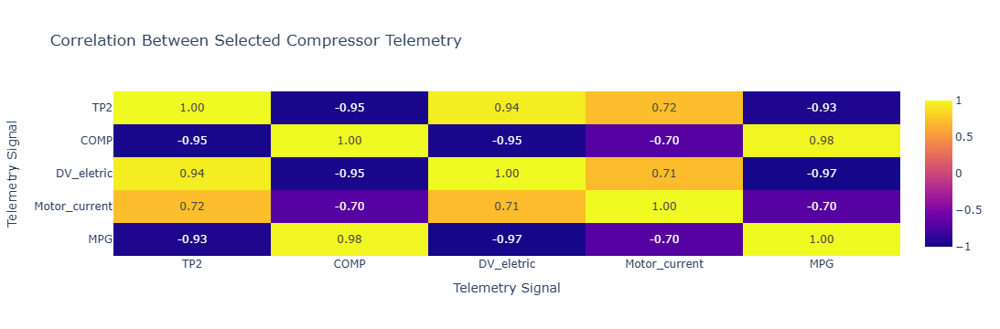

In [15]:
fig = px.imshow(
    correlation_matrix,
    text_auto=".2f",
    aspect="auto",
    zmin=-1,
    zmax=1,
    title="Correlation Between Selected Compressor Telemetry"
)

fig.update_layout(
    xaxis_title="Telemetry Signal",
    yaxis_title="Telemetry Signal"
)

fig.show()

#### Finding

The correlation analysis strongly supports the operating relationships identified through the preceding hypothesis-led analysis.

The strongest relationships include:

- `TP2` and `COMP`: **r = -0.952**, supporting the strong inverse association between compressor pressure (`TP2`) and compressor control state (`COMP`);
- `TP2` and `DV_eletric`: **r = 0.942**, supporting the strong positive association between compressor pressure (`TP2`) and loaded compressor operation (`DV_eletric`);
- `COMP` and `DV_eletric`: **r = -0.950**, confirming the strong inverse relationship between the complementary compressor operating-state signals;
- `TP2` and `Motor_current`: **r = 0.716**, providing additional evidence that the high-pressure operating regime is associated with increased motor activity; and
- `DV_eletric` and `Motor_current`: **r = 0.706**, providing further evidence that loaded compressor operation is associated with increased motor activity.

`MPG` also exhibits very strong associations with the operating-state variables, particularly `COMP` (**r = 0.981**) and `DV_eletric` (**r = -0.970**). These relationships are consistent with the documented role of `MPG` in compressor control and provide additional statistical support for the operating-state interpretation.

Overall, the correlation structure is consistent with the operational behaviour established through the preceding descriptive analysis and provides a consolidated statistical summary of the selected telemetry signals.

The correlation analysis is therefore used as **supporting evidence rather than as the basis for feature selection or causal interpretation**.

## 3. Feature Engineering: Compressor Utilisation and Operational Metrics

The preceding analysis established a consistent relationship between **compressor operating state, pressure response, and electrical demand**.

The next stage transforms selected telemetry signals into operational metrics that are more meaningful from a **maintenance, operational, and customer perspective**.

Rather than generating a large number of candidate features, feature engineering is kept deliberately **domain-led and incremental**. The objective is to quantify how the compressor is being used over time and determine whether changes in utilisation, cycling behaviour, and loaded-operation duration provide useful evidence around the documented air-leak periods.

The initial feature set focuses on:

- **loaded utilisation**, representing the proportion of observed telemetry in which the compressor operates under load;
- **load-cycle frequency**, representing how frequently the compressor transitions into loaded operation;
- **loaded-cycle duration**, representing how long individual periods of loaded operation persist; and
- **loaded motor current**, explored to determine whether changes in compressor workload are accompanied by meaningful changes in electrical demand.

Additional temporal features are introduced only where the subsequent failure investigation provides evidence that they are operationally useful. This evidence-led approach ultimately motivates the use of **rolling loaded utilisation** to capture sustained changes in recent compressor workload.

### Feature Engineering Roadmap

The following features were progressively explored during the analysis. Features were retained where they provided distinct and interpretable operational information.

| Derived feature | Source telemetry | Operational interpretation | Assessment |
|---|---|---|---|
| **Loaded utilisation %** | `DV_eletric` | Proportion of observed telemetry in which the compressor operates under load | **Retained** |
| **Load-cycle count** | `DV_eletric` transitions | Number of transitions into loaded compressor operation within a defined period | **Retained** |
| **Loaded-cycle duration** | `DV_eletric` + `timestamp` | Observed elapsed duration of individual loaded compressor cycles | **Retained** |
| **Mean loaded motor current** | `Motor_current` + `DV_eletric` | Typical motor current during loaded compressor operation | **Explored; not retained as a core feature** |
| **Rolling loaded utilisation** | `DV_eletric` + `timestamp` | Recent persistence of loaded compressor operation and developing workload | **Introduced following failure investigation** |

Feature engineering was intentionally limited to metrics that provided interpretable evidence relevant to compressor workload and the documented air-leak periods.

`Motor_current` was evaluated but not retained as a core operational feature because its central loaded-state behaviour showed relatively limited variation. In contrast, utilisation, cycle frequency and cycle duration provided clearer information about **how frequently and for how long the compressor operated under load**.

Rolling utilisation was not introduced in advance. It was subsequently engineered after the initial documented-event investigation identified **sustained loaded operation** as a potentially important characteristic. This preserves the evidence-led nature of the analysis rather than introducing additional features without an operational justification.

### 3a. Loaded Compressor Utilisation

The preceding analysis established that `DV_eletric` provides a reliable indicator of compressor load state, with `DV_eletric = 1` corresponding to loaded compressor operation.

While the raw digital signal describes the compressor's state at an individual observation, it does not directly communicate how heavily the compressor is being utilised over time.

A **loaded utilisation** metric is therefore derived as the proportion of observed telemetry in which `DV_eletric = 1`.

Because `DV_eletric` is binary, its mean within a defined time period represents the proportion of observations during which the compressor is operating under load:

> **Loaded utilisation (%) = mean(`DV_eletric`) × 100**

This transforms the raw load-state signal into an operational metric that can be aggregated over time and later compared with documented air-leak periods.

The first question is:

> **How does loaded compressor utilisation vary over time during the development period?**

In [16]:
daily_utilisation = (df.set_index("timestamp").resample("D")["DV_eletric"].agg(observed_samples="count",loaded_samples="sum",
          loaded_utilisation="mean").reset_index())

In [17]:
daily_utilisation["loaded_utilisation_pct"] = daily_utilisation["loaded_utilisation"] * 100
daily_utilisation.head()

,timestamp,observed_samples,loaded_samples,loaded_utilisation,loaded_utilisation_pct
0,2020-03-01,7263,845.0,0.116343,11.634311
1,2020-03-02,7570,1234.0,0.163012,16.301189
2,2020-03-03,7252,1238.0,0.170712,17.071153
3,2020-03-04,8668,1106.0,0.127596,12.759575
4,2020-03-05,8691,1434.0,0.164998,16.499827


In [18]:
daily_utilisation.describe().T

,count,mean,min,25%,50%,75%,max,std
timestamp,153,2020-05-16 00:00:00,2020-03-01 00:00:00,2020-04-08 00:00:00,2020-05-16 00:00:00,2020-06-23 00:00:00,2020-07-31 00:00:00,NaN
observed_samples,153.0,7066.235294,0.0,6809.0,7466.0,8518.0,8717.0,1984.340709
loaded_samples,153.0,1324.117647,0.0,642.0,907.0,1219.0,8572.0,1479.108635
loaded_utilisation,152.0,0.194074,0.0,0.093998,0.124838,0.172292,1.0,0.200794
loaded_utilisation_pct,152.0,19.407374,0.0,9.399811,12.48384,17.229234,100.0,20.079422


In [19]:
daily_utilisation[daily_utilisation["observed_samples"] == 0]

,timestamp,observed_samples,loaded_samples,loaded_utilisation,loaded_utilisation_pct
56,2020-04-26,0,0.0,NaN,NaN


In [20]:
daily_utilisation.sort_values("loaded_utilisation_pct", ascending=False).set_index("timestamp").round(2).head(10)

,observed_samples,loaded_samples,loaded_utilisation,loaded_utilisation_pct
timestamp,,,,
2020-06-07,4888,4888.0,1.00,100.00
2020-06-06,7343,7343.0,1.00,100.00
2020-03-29,7199,7199.0,1.00,100.00
2020-04-18,8663,8572.0,0.99,98.95
2020-05-20,7462,7268.0,0.97,97.40
2020-06-24,7162,5727.0,0.80,79.96
2020-06-23,7159,5712.0,0.80,79.79
2020-04-12,7125,4553.0,0.64,63.90
2020-06-05,8716,5546.0,0.64,63.63


#### Data Coverage Consideration

Telemetry coverage is not uniform across the development period. **26 April 2020 contains no observations**, while some other days contain reduced telemetry coverage.

`loaded_utilisation_pct` therefore represents the **proportion of available telemetry observations** during which the compressor is loaded, rather than an assumption of complete daily operating coverage.

`observed_samples` is retained alongside the utilisation metric to make this limitation transparent during subsequent analysis.

No assumption is made about the cause of reduced telemetry coverage.

#### Feature Assessment

`loaded_utilisation_pct` transforms the binary `DV_eletric` load-state signal into an interpretable measure of compressor workload over a defined period.

The metric represents the **percentage of available telemetry observations during which the compressor was operating under load**.

Telemetry coverage is not uniform across all days, including one day with no observations. `observed_samples` is therefore retained alongside the utilisation metric so that periods with incomplete telemetry coverage can be identified during subsequent analysis.

At this stage, elevated utilisation is **not interpreted as evidence of abnormal operation or air leakage**. The feature is retained for temporal comparison with the documented air-leak periods in the subsequent insight analysis.

### 3b. Compressor Cycling Behaviour

Loaded utilisation quantifies the proportion of available telemetry observations in which the compressor operates under load, but it does not explain **how that utilisation occurs over time**.

Elevated utilisation could result from:

- the compressor entering loaded operation more frequently;
- individual loaded periods being sustained for longer; or
- a combination of both behaviours.

To distinguish between these behaviours, transitions in `DV_eletric` are used to derive two complementary operational metrics:

- **Load-cycle count** — how frequently the compressor enters loaded operation; and
- **Loaded-cycle duration** — how long individual periods of loaded operation are sustained.

> **Question:** When compressor utilisation increases, is the additional workload associated with more frequent loaded cycles, longer sustained loaded operation, or a combination of both?

#### Identifying Loaded Cycle Starts

To understand compressor cycling behaviour, the first step is to identify each point at which the compressor **enters loaded operation**.

The question being asked at every telemetry observation is:

> **Has the compressor just transitioned from a non-loaded state (`DV_eletric = 0`) into a loaded state (`DV_eletric = 1`)?**

A new feature, `load_cycle_start`, is therefore created by comparing the current `DV_eletric` state with the previous observation.

| Time | Previous State | Current State | `load_cycle_start` | Interpretation |
|---|---:|---:|:---:|---|
| 10:00:00 | 0 | 0 | False | Compressor remains non-loaded |
| 10:00:10 | 0 | **1** | **True** | **Compressor enters loaded operation - a new loaded cycle starts** |
| 10:00:20 | 1 | 1 | False | Compressor remains loaded - the existing cycle continues |
| 10:00:30 | 1 | 1 | False | Compressor remains loaded - the existing cycle continues |
| 10:00:40 | 1 | 0 | False | Compressor returns to a non-loaded state - the loaded cycle ends |
| 10:00:50 | 0 | **1** | **True** | **Compressor enters loaded operation again - a new loaded cycle starts** |

Importantly, `load_cycle_start = False` does **not** necessarily mean that the compressor is not loaded.

When `DV_eletric` remains `1` across consecutive observations, the compressor remains under load but no new cycle is counted. A new loaded cycle is recorded only when the signal transitions from `0 → 1`.

> `DV_eletric` describes the compressor's **current load state**, while `load_cycle_start` identifies the **event of entering that state**.

This distinction allows compressor workload to be separated into **how frequently loaded operation begins** and **how long loaded operation is sustained**.

In [21]:
df["previous_load_state"] = df["DV_eletric"].shift(1)

In [22]:
df["load_cycle_start"] = ((df["DV_eletric"] == 1) & (df["previous_load_state"] == 0))

In [23]:
df.loc[df["load_cycle_start"],["timestamp", "previous_load_state", "DV_eletric", "load_cycle_start"]]

,timestamp,previous_load_state,DV_eletric,load_cycle_start
75,2020-03-01 04:12:33,0.0,1.0,True
195,2020-03-01 04:32:22,0.0,1.0,True
316,2020-03-01 04:52:21,0.0,1.0,True
436,2020-03-01 05:12:11,0.0,1.0,True
554,2020-03-01 05:31:40,0.0,1.0,True
...,...,...,...,...
1080587,2020-07-31 22:29:40,0.0,1.0,True
1080716,2020-07-31 22:50:59,0.0,1.0,True
1080846,2020-07-31 23:12:28,0.0,1.0,True
1080974,2020-07-31 23:33:36,0.0,1.0,True


#### Cycle-Start Validation

The transition logic identifies **12,577 loaded-cycle starts** across the development period.

Each identified start represents a transition from `DV_eletric = 0` to `DV_eletric = 1`, confirming that the feature counts **new entries into loaded operation rather than every observation recorded while the compressor remains loaded**.

This distinction is important because sustained loaded operation may contain **no additional cycle starts** until the compressor first returns to a non-loaded state and subsequently transitions back into load.

### 3b.2 Loaded Cycle ID

Each `0 --> 1` transition in `DV_eletric` identifies the start of a new loaded compressor cycle.

To distinguish individual loaded periods, each detected cycle is assigned a sequential `load_cycle_id`. Consecutive observations where `DV_eletric = 1` retain the same cycle ID until the compressor returns to a non-loaded state.

For example:

| Time | Load State | Cycle ID | Interpretation |
|---|---:|---:|---|
| 10:00:10 | 1 | **1** | First detected loaded cycle begins |
| 10:00:20 | 1 | **1** | Compressor remains within Cycle 1 |
| 10:00:30 | 0 | NA | Cycle 1 has ended |
| 10:00:50 | 1 | **2** | A new loaded period begins - Cycle 2 |
| 10:01:00 | 1 | **2** | Compressor remains within Cycle 2 |
| 10:01:20 | 0 | NA | Cycle 2 has ended |
| 10:02:00 | 1 | **3** | Another loaded period begins - Cycle 3 |

> `load_cycle_id` therefore acts as a **reference identifier for each distinct period of loaded compressor operation**.

This transforms individual telemetry observations into identifiable operating cycles, allowing each cycle to be analysed separately by **start time and observed duration**.

The identifier also provides a useful **audit trail**, allowing an operational behaviour or unusually long loaded period identified during subsequent analysis to be traced back to the specific cycle and its underlying telemetry observations.

In [24]:
df["load_cycle_id"] = df["load_cycle_start"].cumsum()

In [25]:
df["load_cycle_id"] = df["load_cycle_id"].where(df["DV_eletric"] == 1)

In [26]:
df.loc[df["load_cycle_id"].notna(),["timestamp", "DV_eletric", "load_cycle_start", "load_cycle_id"]].head(10)

,timestamp,DV_eletric,load_cycle_start,load_cycle_id
75,2020-03-01 04:12:33,1.0,True,1.0
76,2020-03-01 04:12:43,1.0,False,1.0
77,2020-03-01 04:12:52,1.0,False,1.0
78,2020-03-01 04:13:02,1.0,False,1.0
79,2020-03-01 04:13:12,1.0,False,1.0
80,2020-03-01 04:13:22,1.0,False,1.0
81,2020-03-01 04:13:32,1.0,False,1.0
82,2020-03-01 04:13:42,1.0,False,1.0
83,2020-03-01 04:13:52,1.0,False,1.0
84,2020-03-01 04:14:02,1.0,False,1.0


#### Cycle ID Validation

The output confirms that a single `load_cycle_id` is retained across consecutive observations while `DV_eletric = 1`, with only the initial `0 --> 1` transition identified as `load_cycle_start = True`.

This provides a traceable representation of each loaded operating cycle and allows the next stage to determine **how long each identified cycle was sustained**.

#### Loaded Cycle Duration

Once individual loaded operating cycles have been identified, the duration of each cycle can be measured using its first and last observed timestamps.

> **Loaded cycle duration = cycle end time − cycle start time**

This provides a direct measure of how long the compressor remains in a loaded operating period before returning to a non-loaded state.

The intention is to determine whether elevated compressor utilisation is associated with **longer sustained loaded operation**, rather than only more frequent cycle starts.

Because the telemetry contains periods of incomplete coverage, cycle duration will subsequently be checked against timestamp continuity before unusually long cycles are interpreted.

In [27]:
cycle_summary = (df.dropna(subset=["load_cycle_id"]).groupby("load_cycle_id").agg(cycle_start=("timestamp", "min"),
          cycle_end=("timestamp", "max")).reset_index())

In [28]:
cycle_summary["cycle_duration"] = cycle_summary["cycle_end"] - cycle_summary["cycle_start"]

In [29]:
cycle_summary.head(5)

,load_cycle_id,cycle_start,cycle_end,cycle_duration
0,1.0,2020-03-01 04:12:33,2020-03-01 04:14:42,0 days 00:02:09
1,2.0,2020-03-01 04:32:22,2020-03-01 04:34:41,0 days 00:02:19
2,3.0,2020-03-01 04:52:21,2020-03-01 04:54:20,0 days 00:01:59
3,4.0,2020-03-01 05:12:11,2020-03-01 05:14:10,0 days 00:01:59
4,5.0,2020-03-01 05:31:40,2020-03-01 05:33:39,0 days 00:01:59


In [30]:
cycle_summary["cycle_duration"].describe().T

count                     12577
mean     0 days 00:03:32.590204
std      0 days 01:02:55.715384
min             0 days 00:00:00
25%             0 days 00:00:47
50%             0 days 00:01:59
75%             0 days 00:02:09
max             3 days 04:05:48
Name: cycle_duration, dtype: object

#### Feature Assessment

The derived cycle durations show that loaded compressor cycles are typically relatively short.

Across the **12,577 identified loaded cycles**, the median observed duration is approximately **1 minute 59 seconds**, while **75% of cycles have an observed duration of approximately 2 minutes 9 seconds or less**.

The distribution nevertheless contains a long upper tail, including substantially longer elapsed cycle durations. These longer periods are not interpreted as abnormal operation at this stage and are retained for subsequent temporal comparison with the documented air-leak periods.

Importantly, `cycle_duration` represents the **elapsed time between the first and last available telemetry observations assigned to the same loaded cycle**. Where telemetry coverage is interrupted, the compressor's operating state during the missing interval cannot be directly observed. Unusually long cycle durations must therefore be interpreted alongside telemetry continuity.

**Feature decision:** Loaded-cycle duration is retained because it provides information that utilisation alone cannot capture: whether compressor workload is characterised by short repeated loaded periods or by more sustained loaded operation.

### 3b.3 Load Cycle Frequency

Loaded-cycle duration measures how long individual periods of loaded operation are sustained. However, increased compressor workload may also occur because the compressor is **entering loaded operation more frequently**.

Because `load_cycle_start` identifies each observed transition from a non-loaded state (`0`) into a loaded state (`1`), counting these events over a defined period provides a measure of compressor cycling frequency.

> **Load cycle frequency = number of observed loaded-cycle starts within a defined time period**

Daily cycle frequency is therefore derived by counting the number of identified loaded-cycle starts within each calendar day.

The intention is to distinguish between increased utilisation associated with **more frequent compressor cycling** and increased utilisation associated with **longer sustained loaded operation**.

In [31]:
daily_cycle_frequency = (df.set_index("timestamp").resample("D")["load_cycle_start"].sum()
    .reset_index(name="load_cycle_count"))

In [32]:
daily_cycle_frequency.head(10)

,timestamp,load_cycle_count
0,2020-03-01,61
1,2020-03-02,83
2,2020-03-03,78
3,2020-03-04,77
4,2020-03-05,84
5,2020-03-06,77
6,2020-03-07,23
7,2020-03-08,65
8,2020-03-09,59
9,2020-03-10,79


In [33]:
daily_cycle_frequency["load_cycle_count"].describe()

count     153.000000
mean       82.202614
std       164.602366
min         0.000000
25%        41.000000
50%        58.000000
75%        72.000000
max      1258.000000
Name: load_cycle_count, dtype: float64

#### Feature Assessment

Daily load-cycle frequency provides a complementary measure of compressor workload by quantifying **how often loaded operation is initiated**, rather than how long the compressor remains loaded.

Across the development period, the median daily load-cycle count is approximately **58 cycles**, with the middle 50% of days containing approximately **41 to 72 observed cycle starts**.

The distribution also contains substantially higher cycle counts. These periods are not interpreted as abnormal operation at this stage and are retained for subsequent temporal comparison with the documented air-leak periods.

As with daily loaded utilisation, the metric represents cycling behaviour within the **available telemetry observations**. Days with incomplete telemetry coverage should therefore be interpreted with appropriate caution.

**Feature decision:** `load_cycle_count` is retained because it distinguishes increased compressor workload associated with **frequent state transitions** from workload associated with **longer sustained loaded operation**.

### 3c. Electrical Demand During Loaded Operation

The preceding features quantify compressor utilisation and cycling behaviour, but they do not directly describe the **electrical demand associated with loaded operation**.

Earlier exploratory analysis established that `Motor_current` is substantially higher during loaded compressor operation. The next step is therefore to determine whether the **level of motor current while loaded varies sufficiently over time to provide additional operational information** beyond the utilisation and cycling features.

The mean motor current during loaded operation is evaluated at the daily level.

> **Question:** Does electrical demand while the compressor is loaded vary sufficiently over time to provide additional insight into changing compressor workload?

In [34]:
daily_electrical_demand = (df[df["DV_eletric"] == 1].set_index("timestamp").resample("D")["Motor_current"].mean()
    .reset_index(name="mean_loaded_motor_current"))

In [35]:
daily_electrical_demand.head()

,timestamp,mean_loaded_motor_current
0,2020-03-01,5.851651
1,2020-03-02,5.793361
2,2020-03-03,5.819392
3,2020-03-04,5.856121
4,2020-03-05,5.864430


In [36]:
daily_electrical_demand["mean_loaded_motor_current"].describe().T

count    151.000000
mean       5.707475
std        0.566647
min        0.455667
25%        5.768296
50%        5.854597
75%        5.888864
max        5.977373
Name: mean_loaded_motor_current, dtype: float64

#### Motor Current: Feature Assessment and Selection Decision

`Motor_current` provided valuable physical evidence during the exploratory analysis, demonstrating that loaded and non-loaded compressor states are associated with materially different levels of motor activity.

However, the feature-engineering question is different:

> **Once the compressor is already operating under load, does variation in motor current provide additional information about changing compressor workload?**

Daily mean motor current during loaded operation shows relatively limited central variation. The median is approximately **5.85 A**, with the middle 50% of daily values concentrated within a relatively narrow range of approximately **5.77–5.89 A**.

For `mean_loaded_motor_current` to provide substantial additional information for this analysis, we would expect loaded electrical demand to vary meaningfully between operating periods. Instead, the central loaded-state current remains comparatively stable.

From an operational perspective, this suggests that changes in compressor workload are more clearly characterised by **how often the compressor enters loaded operation and how long it remains loaded**, rather than by substantial changes in average motor current while loaded.

Importantly, relatively stable motor current while loaded does **not** imply that the compressor's overall electrical burden is unchanged. If the compressor operates under load more frequently or for longer periods, electrical demand is sustained for longer even when the typical current drawn while loaded remains similar.

**Feature decision:** `mean_loaded_motor_current` is **not retained as a core engineered feature** for the telemetry-to-insight analysis. `Motor_current` nevertheless remains valuable as physical evidence of loaded compressor operation and remains available for further investigation where required.

> **Modelling consideration:** This decision applies to the engineered daily mean feature used in the present visual and statistical analysis. It does not imply that the underlying `Motor_current` telemetry is uninformative. A future multivariate statistical or machine-learning model may identify interactions or conditional relationships involving motor current that are not apparent from descriptive analysis alone.

### 3d. Consolidated Operational Features

Following the feature assessment, the retained daily operational metrics are combined into a single dataset for subsequent temporal analysis against the documented air-leak periods.

The consolidated dataset brings together:

- `loaded_utilisation_pct` --> the proportion of available telemetry observations during which the compressor was operating under load; and
- `load_cycle_count` --> the number of transitions into loaded operation observed each day.

`observed_samples` is retained alongside the utilisation metric to provide telemetry-coverage context during subsequent interpretation.

In [37]:
daily_operational_features = daily_utilisation.merge(daily_cycle_frequency, on="timestamp", how="left")
daily_operational_features.head()

,timestamp,observed_samples,loaded_samples,loaded_utilisation,loaded_utilisation_pct,load_cycle_count
0,2020-03-01,7263,845.0,0.116343,11.634311,61
1,2020-03-02,7570,1234.0,0.163012,16.301189,83
2,2020-03-03,7252,1238.0,0.170712,17.071153,78
3,2020-03-04,8668,1106.0,0.127596,12.759575,77
4,2020-03-05,8691,1434.0,0.164998,16.499827,84


# 4. Telemetry Insight: Documented Air-Leak Analysis

The preceding analysis established an interpretable relationship between compressor operating state, pressure response and electrical demand, before transforming the raw telemetry into a focused set of operational features:

- **Loaded utilisation** - how much of the available telemetry represents loaded compressor operation;
- **Load-cycle frequency** - how frequently the compressor enters loaded operation; and
- **Loaded-cycle duration** - how long individual periods of loaded operation are sustained.

The next stage evaluates how these operational behaviours change during the **documented air-leak periods**.

The telemetry itself does not contain a failure label. Instead, the documented air-leak periods provide external reference windows against which compressor behaviour and the engineered operational features can be evaluated.

The analysis therefore asks:

> **Do documented air leaks correspond with measurable changes in compressor utilisation and cycling behaviour?**

The objective is not to assume that elevated compressor activity represents an air leak, but to determine whether the documented events exhibit identifiable operational patterns that could provide useful **maintenance and efficiency insight**.

The analysis remains evidence-led. Where the existing features do not sufficiently characterise behaviour observed around a documented event, the underlying telemetry will be investigated to determine whether an additional operational feature is justified.

### 4a. Documented Air-Leak Reference Windows

Four documented air-leak periods are available as external operational references.

These timestamps are **not generated from the telemetry or from the engineered features**. They are used as known event windows against which compressor behaviour can be compared.

An initial telemetry-level investigation is first used to understand how compressor behaviour changes around a known event. The engineered operational features are then evaluated against the complete set of documented air-leak periods.

#### Failure Information
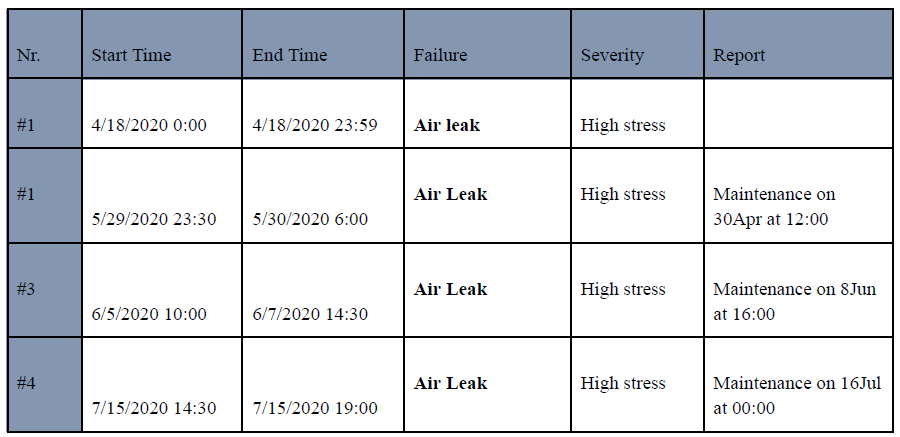
> **Source-data note:** The reference information for the second documented event reports an air-leak period from **29 May to 30 May 2020**, while the associated report states **"Maintenance on 30Apr at 12:00"**. This apparent date inconsistency is retained as provided in the source documentation rather than corrected without supporting evidence. The documented air-leak start and end timestamps are used as the event reference window for the analysis.

In [38]:
air_leak_events = pd.DataFrame({"event": ["Air Leak 1", "Air Leak 2", "Air Leak 3", "Air Leak 4"],
                                "start": pd.to_datetime(["2020-04-18 00:00:00", "2020-05-29 23:30:00",
                                                         "2020-06-05 10:00:00", "2020-07-15 14:30:00"]),
                                "end": pd.to_datetime(["2020-04-18 23:59:00", "2020-05-30 06:00:00",
                                                       "2020-06-07 14:30:00","2020-07-15 19:00:00"])
                            })

In [39]:
air_leak_events

,event,start,end
0,Air Leak 1,2020-04-18 00:00:00,2020-04-18 23:59:00
1,Air Leak 2,2020-05-29 23:30:00,2020-05-30 06:00:00
2,Air Leak 3,2020-06-05 10:00:00,2020-06-07 14:30:00
3,Air Leak 4,2020-07-15 14:30:00,2020-07-15 19:00:00


### 4b. Initial Investigation of Documented Failure Behaviour

Before evaluating the engineered features across all documented air-leak periods, the first event is examined at the underlying telemetry level to understand how compressor behaviour changes around a known failure.

The analysis compares `DV_eletric`, representing loaded compressor operation, with `TP2` compressor pressure across the period immediately surrounding the documented event.

This initial investigation provides a visual reference for comparing behaviour immediately outside and during the documented failure period and helps determine whether the engineered utilisation and cycling features capture operational characteristics relevant to the documented failure.

Any additional feature engineering will be driven by behaviour observed during this investigation rather than introduced in advance.

### 4c. Event 1: Initial Telemetry Investigation

The first documented air-leak event occurred between **18 April 2020 00:00 and 23:59** and was recorded as a high-stress period.

Telemetry from the **24 hours preceding and following the documented event** is included to provide operational context.

The objective at this stage is not to quantify the event using the engineered features, but to examine whether the documented failure coincides with a visible change in the relationship between compressor loaded state (`DV_eletric`) and compressor pressure (`TP2`), relative to the surrounding telemetry.

In [40]:
event_1_start = pd.Timestamp("2020-04-18 00:00:00")
event_1_end = pd.Timestamp("2020-04-18 23:59:00")

In [41]:
event_1_window = df[(df["timestamp"] >= event_1_start - pd.Timedelta(hours=24)) & (df["timestamp"] <= event_1_end + pd.Timedelta(hours=24))].copy()

In [42]:
# Validate the extracted telemetry window
event_1_window["timestamp"].agg(["min", "max"])

min   2020-04-17 00:00:05
max   2020-04-19 23:58:53
Name: timestamp, dtype: datetime64[us]

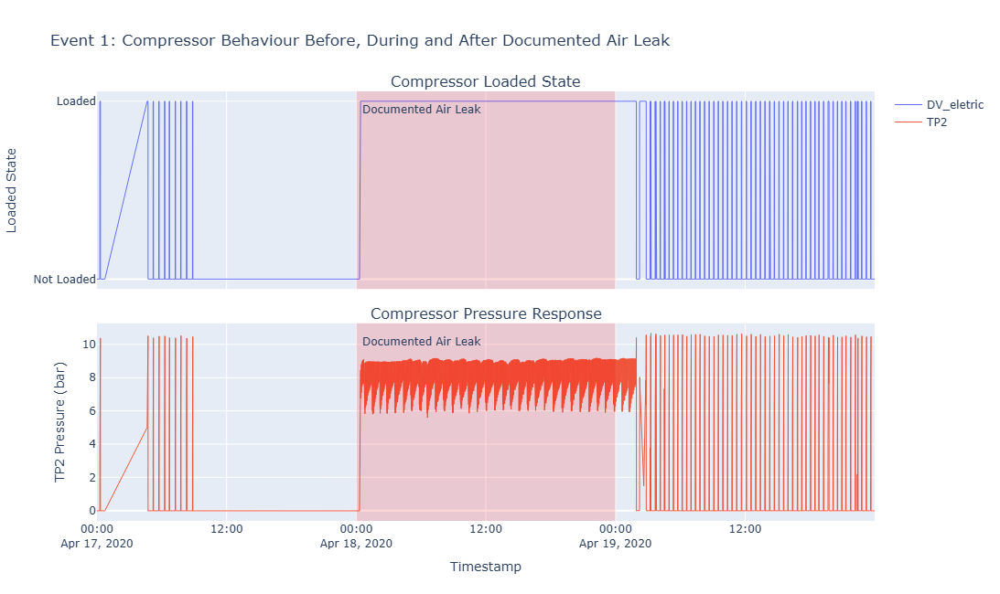

In [43]:
fig = make_subplots(
    rows=2,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.08,
    subplot_titles=(
        "Compressor Loaded State",
        "Compressor Pressure Response"
    )
)

fig.add_trace(
    go.Scatter(
        x=event_1_window["timestamp"],
        y=event_1_window["DV_eletric"],
        mode="lines",
        name="DV_eletric",
        line=dict(width=1)
    ),
    row=1,
    col=1
)

fig.add_trace(
    go.Scatter(
        x=event_1_window["timestamp"],
        y=event_1_window["TP2"],
        mode="lines",
        name="TP2",
        line=dict(width=1)
    ),
    row=2,
    col=1
)

fig.add_vrect(
    x0=event_1_start,
    x1=event_1_end,
    fillcolor="red",
    opacity=0.15,
    line_width=0,
    annotation_text="Documented Air Leak",
    annotation_position="top left",
    annotation_yshift=-10,
    annotation_xshift= 5
)

fig.update_yaxes(
    title_text="Loaded State",
    tickvals=[0, 1],
    ticktext=["Not Loaded", "Loaded"],
    row=1,
    col=1
)

fig.update_yaxes(
    title_text="TP2 Pressure (bar)",
    row=2,
    col=1
)

fig.update_xaxes(
    title_text="Timestamp",
    row=2,
    col=1
)

fig.update_layout(
    title="Event 1: Compressor Behaviour Before, During and After Documented Air Leak",
    height=650,
    hovermode="x unified"
)

fig.show()

#### Event 1 Observation

The documented air-leak period provides an initial reference for comparing compressor operating behaviour immediately outside and during a known failure period.

Before the documented event, `DV_eletric` shows intermittent loaded operation, with `TP2` repeatedly increasing during loaded periods and returning towards its lower state when the compressor is not loaded.

During the documented air-leak period, this operating pattern changes noticeably. `DV_eletric` remains active for a sustained period, while `TP2` remains within an elevated pressure range rather than repeatedly returning towards its lower state.

Following the documented event, the telemetry returns to a more intermittent loaded/non-loaded pattern, accompanied by corresponding variation in `TP2`.

**Observation:** The documented air leak coincides with a transition from intermittent compressor operation to **sustained loaded operation and persistently elevated `TP2` pressure**. This provides evidence that **compressor utilisation and the persistence of loaded operation** are relevant characteristics to investigate across the documented air-leak events.

### 4d. Early-Warning Feature Development

The initial Event 1 investigation indicates that the documented air leak coincides with **sustained loaded compressor operation**, rather than simply a change in how frequently the compressor enters the loaded state.

The existing operational features quantify compressor utilisation, cycle frequency and individual cycle duration. However, these measures primarily describe behaviour over completed operational periods or cycles.

To investigate whether sustained changes in compressor workload could be identified **as they develop**, a rolling utilisation feature is introduced. This provides a time-dependent measure of recent loaded operation and can be evaluated for potential early-warning behaviour against the documented air-leak windows.

The rolling feature is not assumed to predict an air leak. Instead, it is used to investigate whether **increasing persistence of loaded compressor operation** becomes visible before or during documented failure periods, and whether similar behaviour also occurs during periods without a documented air leak.

#### Rolling Loaded Utilisation

A trailing **30-minute window** is used as an exploratory interval for measuring recent compressor workload.

At each telemetry observation, the feature calculates the percentage of available observations within the preceding 30 minutes for which `DV_eletric = 1`:

> **Rolling loaded utilisation (%) = mean(`DV_eletric` over preceding 30 minutes) × 100**

For example, a rolling utilisation of **80%** means that approximately 80% of the available telemetry observations during the preceding 30 minutes represented loaded compressor operation.

The window is **trailing rather than centred**, meaning that each value is calculated using only the current and preceding telemetry observations. This allows the feature to represent workload as it develops through time without using future observations.

The 30-minute interval is an **exploratory analytical window**, not a proposed operational alarm threshold.

In [44]:
df = df.sort_values("timestamp").reset_index(drop=True)

In [45]:
rolling_data = df.set_index("timestamp")

In [46]:
# Calculate 30-minute trailing loaded utilisation
df["rolling_loaded_utilisation_30min"] = rolling_data["DV_eletric"].rolling("30min").mean().mul(100).to_numpy()

In [47]:
df["rolling_observations_30min"] = rolling_data["DV_eletric"].rolling("30min").count().to_numpy()

In [48]:
df.loc[df["timestamp"] >="2020-07-14 23:28:00"][["timestamp","DV_eletric","rolling_loaded_utilisation_30min","rolling_observations_30min"]].head(20)

,timestamp,DV_eletric,rolling_loaded_utilisation_30min,rolling_observations_30min
950784,2020-07-14 23:28:02,0.0,16.483516,182.0
950785,2020-07-14 23:28:12,0.0,16.483516,182.0
950786,2020-07-14 23:28:22,0.0,16.483516,182.0
950787,2020-07-14 23:28:31,0.0,16.483516,182.0
950788,2020-07-14 23:28:41,0.0,16.483516,182.0
950789,2020-07-14 23:28:51,0.0,16.483516,182.0
950790,2020-07-14 23:29:01,0.0,16.483516,182.0
950791,2020-07-14 23:29:11,0.0,16.483516,182.0
950792,2020-07-14 23:29:21,0.0,16.483516,182.0
950793,2020-07-14 23:29:31,0.0,16.483516,182.0


In [49]:
df[["rolling_loaded_utilisation_30min", "rolling_observations_30min"]].describe().round(2)

,rolling_loaded_utilisation_30min,rolling_observations_30min
count,1081134.00,1081134.00
mean,19.09,177.99
std,24.51,17.53
min,0.00,1.00
25%,7.14,182.00
50%,10.44,182.00
75%,16.48,182.00
max,100.00,182.00


#### Rolling Utilisation: Feature Validation

The rolling feature behaves as intended. When `DV_eletric` changes from `0` to `1`, rolling loaded utilisation increases progressively as loaded observations accumulate within the trailing 30-minute window, rather than responding as an instantaneous binary state.

The validation output also shows approximately **182 observations** within a fully observed 30-minute window, consistent with the typical telemetry sampling frequency. Across the complete dataset, the median rolling utilisation is approximately **10.44%**, while the upper quartile is approximately **16.48%**, confirming that sustained high utilisation is not representative of typical compressor behaviour.

Telemetry coverage within the rolling window is retained through `rolling_observations_30min`. Although most windows contain 182 observations, lower counts occur where telemetry coverage is incomplete. This allows rolling utilisation to be interpreted alongside the amount of available telemetry contributing to each calculation.

**Feature assessment:** `rolling_loaded_utilisation_30min` provides a time-dependent measure of recent compressor workload and captures the **persistence of loaded operation as it develops**. It is therefore retained for comparison with the documented air-leak periods.

At this stage, elevated rolling utilisation is not interpreted as evidence of an air leak. Its usefulness depends on whether sustained changes correspond consistently with the documented events and whether similar behaviour also occurs outside those periods.

In [50]:
air_leak_events

,event,start,end
0,Air Leak 1,2020-04-18 00:00:00,2020-04-18 23:59:00
1,Air Leak 2,2020-05-29 23:30:00,2020-05-30 06:00:00
2,Air Leak 3,2020-06-05 10:00:00,2020-06-07 14:30:00
3,Air Leak 4,2020-07-15 14:30:00,2020-07-15 19:00:00


In [51]:
event_onset_results = []

for _, event in air_leak_events.iterrows():

    event_start = event["start"]

    # Last available telemetry observation before the documented event
    before = df[df["timestamp"] < event_start].iloc[-1]

    # First 60 minutes from the documented event start
    onset_window = df[(df["timestamp"] >= event_start) & (df["timestamp"] <= event_start + pd.Timedelta(minutes=60))].copy()

    # First available observation at or after the documented event start
    first = onset_window.iloc[0]

    # Maximum rolling utilisation during the first 60 minutes
    peak_idx = onset_window["rolling_loaded_utilisation_30min"].idxmax()
    peak = onset_window.loc[peak_idx]

    event_onset_results.append({"event": event["event"], "event_start": event_start, 
                                "utilisation_before_pct": before["rolling_loaded_utilisation_30min"],
                                "utilisation_at_start_pct": first["rolling_loaded_utilisation_30min"],
                                "max_utilisation_60min_pct": peak["rolling_loaded_utilisation_30min"],
                                "minutes_to_max": (peak["timestamp"] - event_start).total_seconds() / 60,
                                "observations_at_max": peak["rolling_observations_30min"]
                                })

In [52]:
event_onset_summary = pd.DataFrame(event_onset_results)

In [53]:
event_onset_summary.style.format({
    "utilisation_before_pct": "{:.2f}",
    "utilisation_at_start_pct": "{:.2f}",
    "max_utilisation_60min_pct": "{:.2f}",
    "minutes_to_max": "{:.2f}",
    "observations_at_max": "{:.0f}"
})

,event,event_start,utilisation_before_pct,utilisation_at_start_pct,max_utilisation_60min_pct,minutes_to_max,observations_at_max
0,Air Leak 1,2020-04-18 00:00:00,0.00,0.00,100.00,48.27,148
1,Air Leak 2,2020-05-29 23:30:00,50.55,51.10,100.00,14.83,182
2,Air Leak 3,2020-06-05 10:00:00,45.60,46.15,100.00,18.40,182
3,Air Leak 4,2020-07-15 14:30:00,71.43,71.43,100.00,25.28,182


#### Documented Event Onset: Initial Finding

The onset comparison identifies a consistent change in compressor workload across the documented air-leak events.

All four events reached **100% rolling loaded utilisation within the first 60 minutes** of their documented start. However, the operating state at the beginning of each event differed.

**Air Leak 1** began with rolling utilisation at **0%** and subsequently reached 100% after approximately **48 minutes**, indicating that sustained abnormal workload developed after the documented event began.

In contrast, **Air Leaks 2, 3 and 4** entered their documented failure windows with rolling utilisation already substantially elevated at approximately **51%, 46% and 71% respectively**. Each subsequently reached 100% utilisation within approximately **15–25 minutes**.

This provides evidence that rolling utilisation can identify the development of **sustained abnormal compressor workload** around the documented air-leak events.

For Events 2–4, elevated utilisation was already present immediately before the documented start time. However, the current comparison uses only the last available telemetry observation before each event and therefore does not establish how long the elevated workload had been developing.

**Finding:** The feature demonstrates value for detecting developing abnormal compressor workload. Whether it also provides meaningful **early-warning lead time** requires investigation of the persistence and trajectory of elevated utilisation before the documented event starts.

### 4e. Full-Period Operational Analysis

The engineered operational features are now evaluated across the complete telemetry period alongside the underlying compressor telemetry and all four documented air-leak windows.

The combined visual provides a single operational view of:

- daily loaded utilisation and recent rolling utilisation;
- load-cycle frequency; and
- individual loaded-cycle duration.

The documented air-leak periods are overlaid as external reference windows. This allows behaviour associated with known failures to be compared with the wider operating history, including periods where similar workload characteristics occur outside the documented air-leak windows.

Individual `load_cycle_id` values are retained within the interactive hover information to support traceability from unusual cycle behaviour back to the corresponding telemetry.

In [54]:
# Converting cycle duration to minutes for visualisation.
cycle_summary["cycle_duration_minutes"] = (cycle_summary["cycle_duration"].dt.total_seconds() / 60)

In [55]:
# Downsample rolling utilisation for full-period visualisation only
rolling_plot = df.set_index("timestamp")["rolling_loaded_utilisation_30min"].resample("5min").mean().reset_index()
rolling_plot.head()

,timestamp,rolling_loaded_utilisation_30min
0,2020-03-01 04:00:00,0.000000
1,2020-03-01 04:05:00,0.000000
2,2020-03-01 04:10:00,4.659220
3,2020-03-01 04:15:00,13.302807
4,2020-03-01 04:20:00,10.297950


In [56]:
# Excluding zero duration cycles as they can't be displayed on a log axis.
# They are excluded from the visual only, not from the development data
cycle_plot = cycle_summary[cycle_summary["cycle_duration_minutes"] > 0].copy()

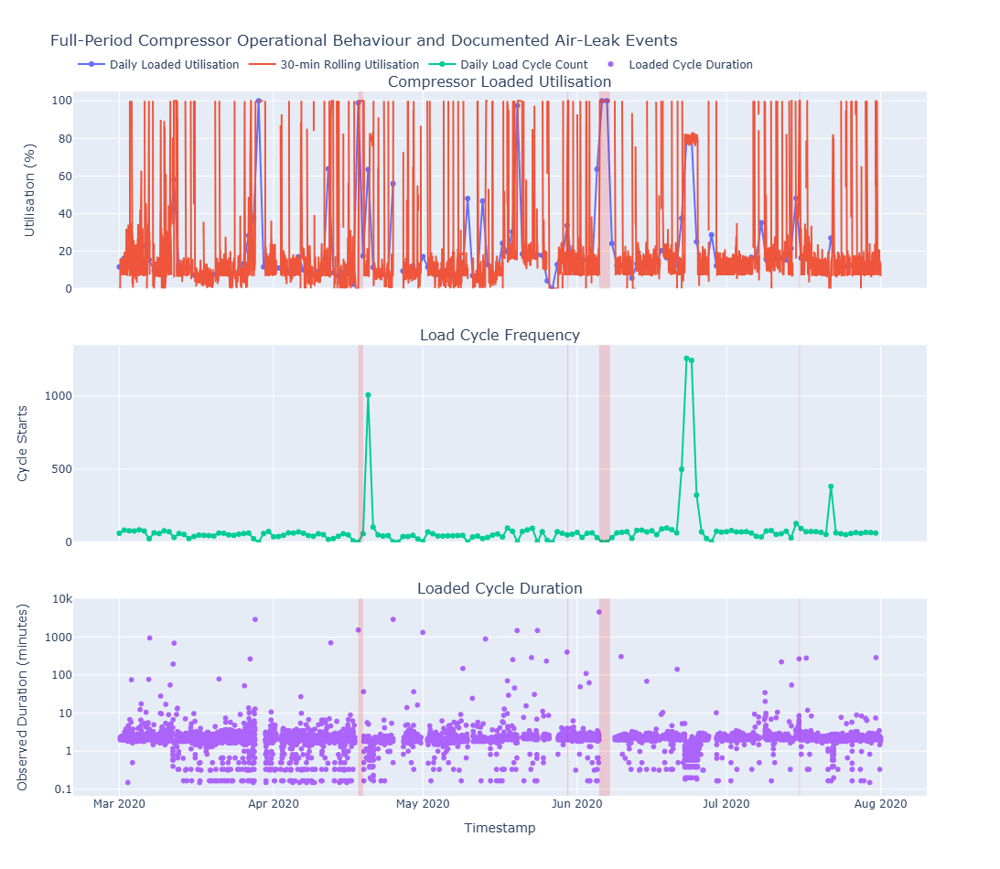

In [57]:
# ------------------------------------------------------------
# 1. Create three-panel figure
# ------------------------------------------------------------

fig = make_subplots(
    rows=3,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.08,
    subplot_titles=(
        "Compressor Loaded Utilisation",
        "Load Cycle Frequency",
        "Loaded Cycle Duration"
    )
)


# ------------------------------------------------------------
# 2. Panel 1 - Loaded utilisation
# ------------------------------------------------------------

fig.add_trace(
    go.Scatter(
        x=daily_operational_features["timestamp"],
        y=daily_operational_features["loaded_utilisation_pct"],
        mode="lines+markers",
        name="Daily Loaded Utilisation",
        hovertemplate=(
            "Date: %{x|%d %b %Y}<br>"
            "Daily Utilisation: %{y:.1f}%"
            "<extra></extra>"
        )
    ),
    row=1,
    col=1
)

fig.add_trace(
    go.Scatter(
        x=rolling_plot["timestamp"],
        y=rolling_plot["rolling_loaded_utilisation_30min"],
        mode="lines",
        name="30-min Rolling Utilisation",
        hovertemplate=(
            "Timestamp: %{x|%d %b %Y %H:%M}<br>"
            "Rolling Utilisation: %{y:.1f}%"
            "<extra></extra>"
        )
    ),
    row=1,
    col=1
)


# ------------------------------------------------------------
# 4. Panel 2 - Load cycle frequency
# ------------------------------------------------------------

fig.add_trace(
    go.Scatter(
        x=daily_operational_features["timestamp"],
        y=daily_operational_features["load_cycle_count"],
        mode="lines+markers",
        name="Daily Load Cycle Count",
        hovertemplate=(
            "Date: %{x|%d %b %Y}<br>"
            "Load Cycles: %{y:.0f}"
            "<extra></extra>"
        )
    ),
    row=2,
    col=1
)


# ------------------------------------------------------------
# 5. Panel 3 - Loaded cycle duration
# ------------------------------------------------------------

fig.add_trace(
    go.Scattergl(
        x=cycle_plot["cycle_start"],
        y=cycle_plot["cycle_duration_minutes"],
        mode="markers",
        name="Loaded Cycle Duration",
        customdata=cycle_plot[
            ["load_cycle_id", "cycle_end"]
        ],
        hovertemplate=(
            "Cycle ID: %{customdata[0]:.0f}<br>"
            "Cycle Start: %{x|%d %b %Y %H:%M:%S}<br>"
            "Cycle End: %{customdata[1]|%d %b %Y %H:%M:%S}<br>"
            "Observed Duration: %{y:.2f} minutes"
            "<extra></extra>"
        )
    ),
    row=3,
    col=1
)


# ------------------------------------------------------------
# 6. Overlay documented air-leak windows
# ------------------------------------------------------------

for _, event in air_leak_events.iterrows():

    for row in [1, 2, 3]:

        fig.add_vrect(
            x0=event["start"],
            x1=event["end"],
            fillcolor="red",
            opacity=0.15,
            line_width=0,
            row=row,
            col=1
        )


# ------------------------------------------------------------
# 7. Configure axes
# ------------------------------------------------------------

fig.update_yaxes(
    title_text="Utilisation (%)",
    range=[0, 105],
    row=1,
    col=1
)

fig.update_yaxes(
    title_text="Cycle Starts",
    rangemode="tozero",
    row=2,
    col=1
)

fig.update_yaxes(
    title_text="Observed Duration (minutes)",
    type="log",
    row=3,
    col=1
)

fig.update_xaxes(
    title_text="Timestamp",
    row=3,
    col=1
)


# ------------------------------------------------------------
# 8. Final figure layout
# ------------------------------------------------------------

fig.update_layout(
    title=(
        "Full-Period Compressor Operational Behaviour "
        "and Documented Air-Leak Events"
    ),
    height=950,
    hovermode="x unified",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="left",
        x=0
    )
)

fig.show()

# 5. Conclusion and Operational Insight

The analysis demonstrates that the documented air-leak periods are associated with measurable changes in compressor operating behaviour.

Across the documented events, the most informative characteristics were:

- **Rolling loaded utilisation**, which captures changes in recent compressor workload;
- **Observed loaded-cycle duration**, which captures the persistence of loaded operation;
- **Load-cycle frequency**, which provides context on whether increased workload results from repeated cycling or sustained operation within an existing loaded cycle; and
- **TP2 and `DV_eletric`**, which provide the underlying pressure and operating-state context required to interpret these operational features.

The documented events did not exhibit an identical onset pattern. However, all four documented air-leak periods reached **100% rolling loaded utilisation within the first hour of their recorded start**. For three of the four events, rolling utilisation was already substantially elevated at the documented start, while Event 1 transitioned rapidly from low utilisation into sustained loaded operation.

### Non-Documented High-Utilisation Period

Importantly, the full-period analysis also identified sustained high compressor utilisation outside the documented air-leak windows.

A notable example occurred during **28–29 March**, where the compressor exhibited sustained high loaded utilisation despite no air leak being identified within the available reference information.

Investigation of this period showed that high utilisation could coexist with few or no new load-cycle starts because the compressor was already within an existing loaded cycle. Loaded-cycle duration provided additional context by showing that the existing loaded period was being sustained, while `TP2` also exhibited unusual pressure behaviour during the period.

The underlying cause cannot be determined from the available reference information. The period is therefore treated as a **non-documented period of sustained high utilisation**, rather than being classified as an undocumented air leak or a false alarm.

This provides an important counterexample to the documented failure periods:

> **High rolling utilisation is not specific to air leakage. It is better interpreted as an indicator of sustained compressor workload that may warrant further investigation.**

The combined operational view also demonstrates why the engineered features should be interpreted together. High utilisation may result from repeated compressor cycling, prolonged loaded operation, or a combination of both. In particular, a low number of new cycle starts can coexist with very high utilisation when the compressor remains within an existing loaded cycle for an extended period.

The principal operational insight is therefore:

> **The telemetry can identify developing and persistent changes in compressor workload that may warrant engineering investigation, without assuming the underlying cause.**

For a customer, these features could support a **Green-Amber-Red (RAG) condition-monitoring framework**, where increasing workload and persistence progressively raise the condition state and sustained abnormal behaviour prompts engineering investigation.


## Future Development

A production implementation could extend this analysis through **robust change-point detection**, comparing current compressor behaviour against a recent operating baseline.

The exploratory analysis demonstrates considerable variation in compressor utilisation across the telemetry period. Consequently, a single global threshold may not adequately represent changing operating conditions.

A more adaptive approach could use a **preceding-window baseline**, where current rolling utilisation is compared with the asset's recent operating behaviour. A rolling median and **Median Absolute Deviation (MAD)** could provide a robust measure of material departures from this local baseline while reducing sensitivity to extreme observations.

Detected changes could then be combined with an agreed **persistence window**, **observed loaded-cycle duration**, and relevant pressure behaviour so that short-lived workload changes do not automatically trigger investigation.

A potential production monitoring workflow would therefore be:

**Telemetry --> Recent Operating Baseline --> Robust Change-Point Detection --> Persistence Assessment --> Cycle-Duration Context --> RAG Condition --> Engineering Investigation**

Production thresholds and persistence periods would require calibration against historical operating behaviour, maintenance records and engineering knowledge before user acceptance testing (UAT) and deployment.


## Limitations

The telemetry does not contain explicit failure labels; documented air-leak periods are therefore used as **external reference windows rather than training targets**.

Telemetry gaps were retained rather than imputed. Consequently, unusually long observed cycle durations spanning periods of missing telemetry should not be interpreted as confirmed continuous compressor operation.

The 30-minute rolling utilisation window was selected as an **exploratory monitoring interval** for this POC and has not been established as an optimal production window. Further analysis should evaluate a range of rolling windows to determine how window length affects the relationship between compressor workload, documented events and the timeliness of abnormal-behaviour detection. This would help identify a monitoring interval that balances **responsiveness to developing changes against sensitivity to short-lived operational variation**.

The resulting window should not automatically be assumed to generalise across an asset fleet. Different compressors may exhibit different operating cycles, utilisation patterns and baseline behaviour. A production implementation would therefore benefit from **longitudinal analysis of individual assets**, using sufficient historical telemetry and maintenance information to determine whether monitoring parameters should be calibrated at asset level or whether groups of assets exhibit sufficiently similar behaviour to share common parameters.

Finally, abnormal compressor workload should not be interpreted as evidence of an air leak without additional operational or engineering investigation.